In [1]:
import cv2 as cv
import os
import shutil
import numpy as np
from matplotlib import pyplot as plt

40


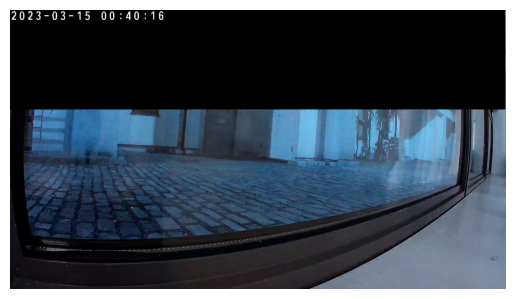

In [342]:
# Extracts frames from given video, taking a frame every n milliseconds
def extract_frames(video_path, interval):
    video = cv.VideoCapture(video_path)

    frames = []
    success, frame = video.read()
    total_frames = video.get(cv.CAP_PROP_FRAME_COUNT)
    i = 0
    while success and video.get(cv.CAP_PROP_POS_FRAMES) < total_frames:
        frames.append(frame)
        assert i < 500, "Maximum number of frames exceeded"
        video.set(cv.CAP_PROP_POS_MSEC, i * interval)
        success, frame = video.read()
        i += 1
    return frames

frames = extract_frames('sample_videos/cool_fox.mp4', 250)
print(len(frames))
plt.imshow(frames[0])
plt.axis('off')

0.0
22.63


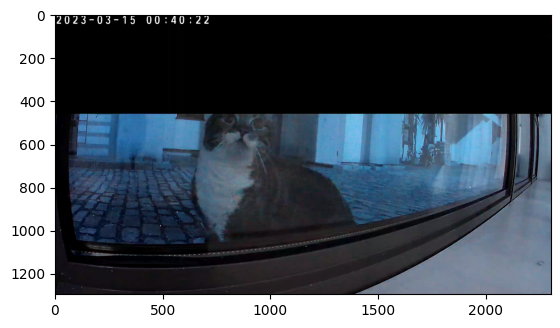

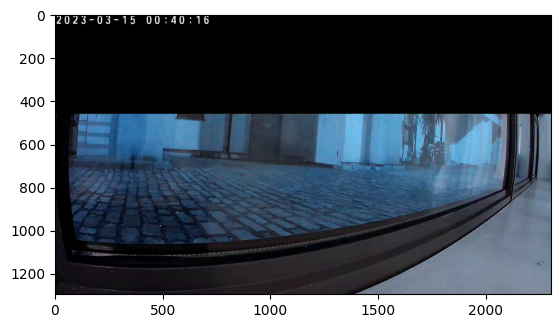

In [12]:
# Mean squared error between 2 frames
def mse(frame1, frame2):
    assert frame1.shape == frame2.shape, "Shapes do not match"
    squared_error = (frame1 - frame2) ** 2
    return np.mean(squared_error)

img1 = cv.imread("sample_frames/cool_cat.png")
img2 = cv.imread("sample_frames/no_cool_cat.png")
print(mse(img1, img1)) # Should be 0
print(round(mse(img1, img2), 2)) # Should not be 0
plt.imshow(img1)
plt.show()
plt.imshow(img2)
plt.show()

In [126]:
# Returns all frames that have a MSE higher than threshold when compared to reference frame
def pick_frames_threshold(frames, reference_frame, threshold):
    picked_frames = [frame for frame in frames if mse(frame, reference_frame) >= threshold]
    return picked_frames

# Saves frame if its MSE with ref. frame exceeds threshold, then copies it to ref. frame
# Does not include first and last 4 frames
def pick_frames_sliding(frames, threshold):
    reference_frame = frames[0]
    picked_frames = []
    for frame in frames:
        if mse(frame, reference_frame) >= threshold:
            reference_frame = frame
            picked_frames.append(frame)
    return picked_frames[4:-4]

frames = extract_frames('sample_videos/cool_cat.mp4', 250)
threshold_sample = pick_frames_threshold(frames, frames[0], 13)
sliding_sample = pick_frames_sliding(frames, 2)
print(len(threshold_sample), len(sliding_sample))

31 16


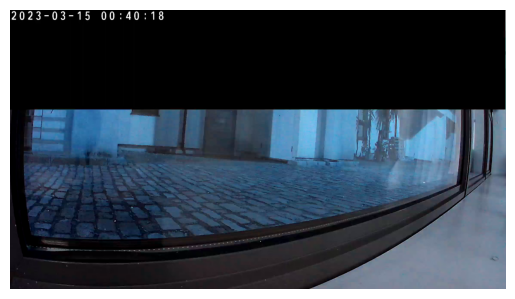

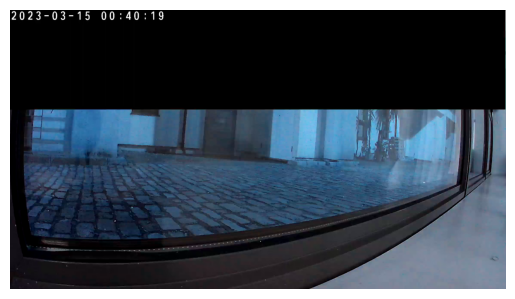

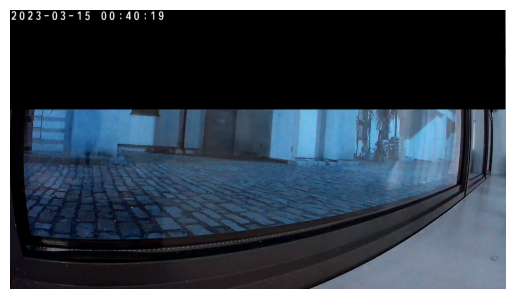

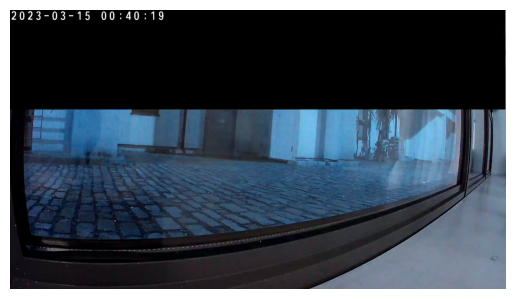

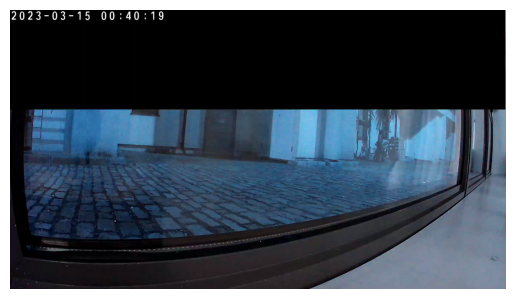

...

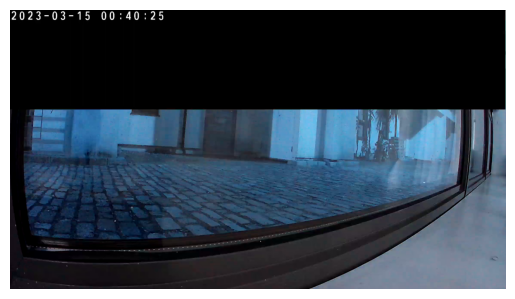

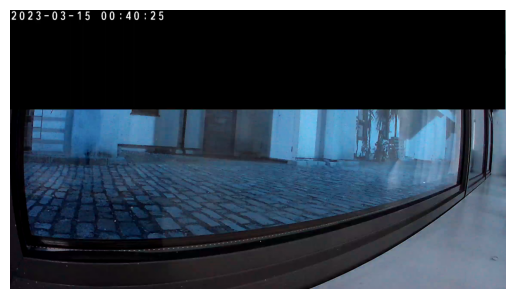

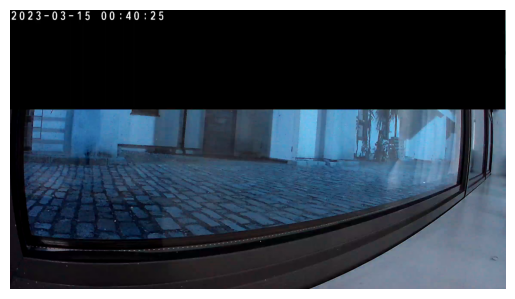

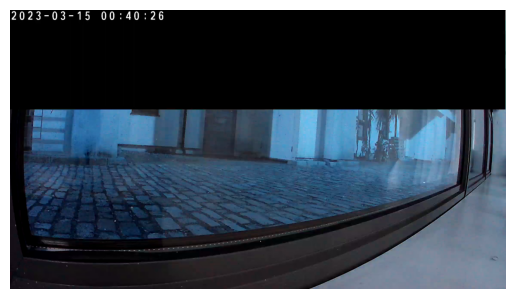

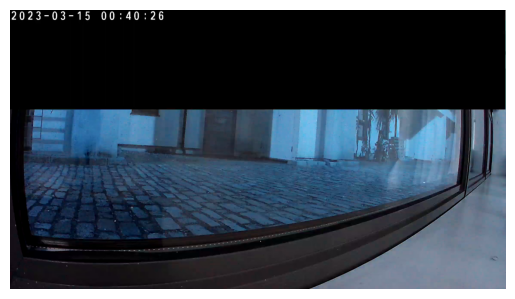

In [129]:
for img in threshold_sample:
    plt.imshow(img)
    plt.axis('off')
    plt.show()

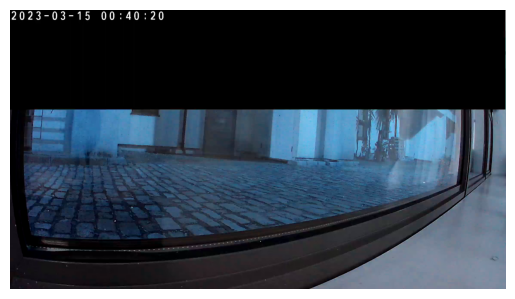

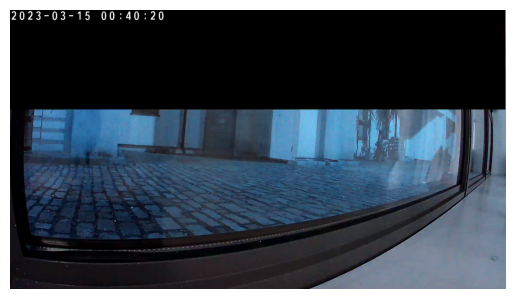

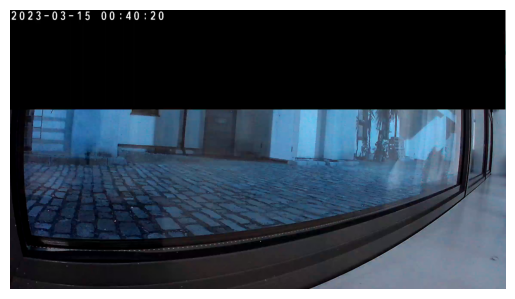

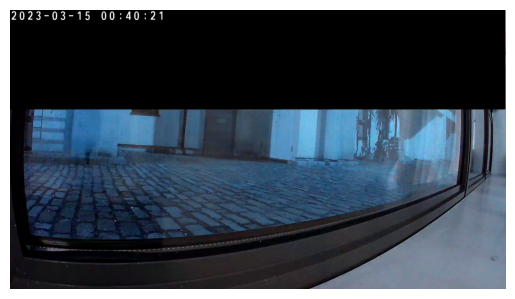

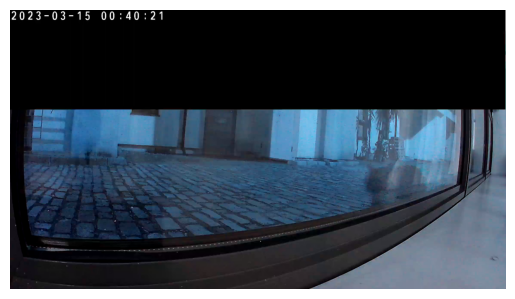

...

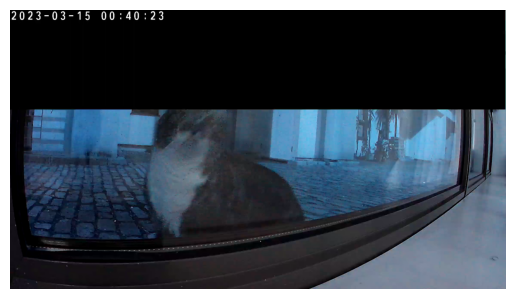

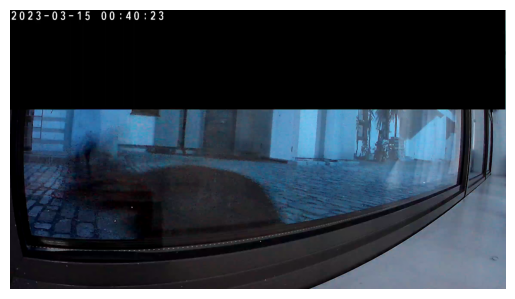

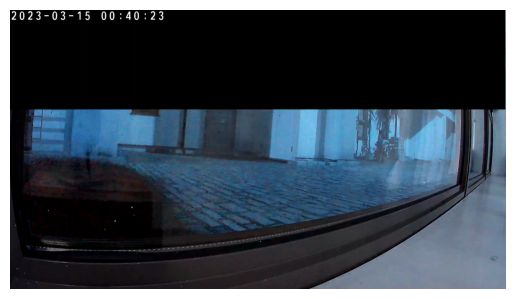

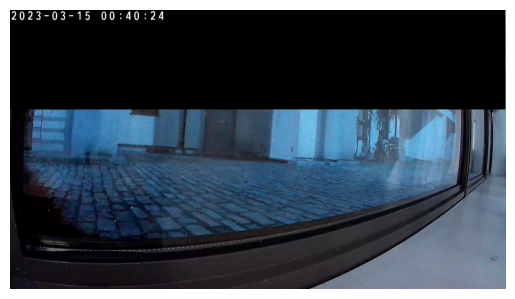

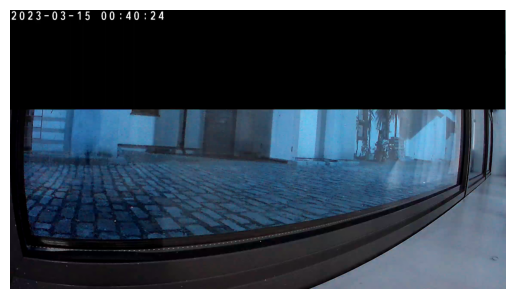

In [381]:
for img in sliding_sample:
    plt.imshow(img)
    plt.axis('off')
    plt.show()

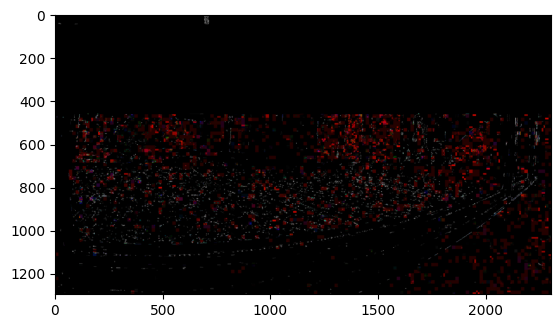

In [377]:
diff = np.array(frames[0] - frames[7]) ** 2
plt.imshow(diff)

Experiments with denoising

MSE between empty images: 14.93 
MSE between empty and a cat: 17.64 
difference: 17 %


<Figure size 640x480 with 0 Axes>

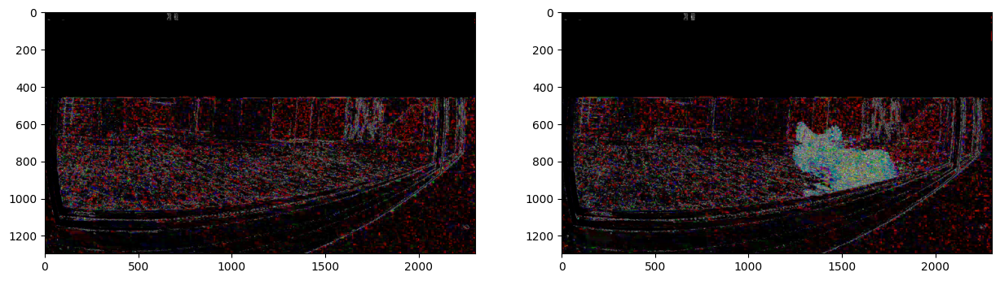

In [351]:
# Compares difference between sample images, using given function on images
def test_denoising(func, *args, **kwargs):
    # Load sample images
    empty1 = func(cv.imread('sample_noise/empty1.png'), *args, **kwargs)
    empty2 = func(cv.imread('sample_noise/empty2.png'), *args, **kwargs)
    cat = func(cv.imread('sample_noise/cat.png'), *args, **kwargs)

    # Create subplots for both difference images
    plt.figure()
    fig, axs = plt.subplots(1,2)
    fig.set_size_inches(15, 15)

    # Calculate MSE between pairs of images
    mse_empty = round(mse(empty1, empty2), 2)
    mse_cat = round(mse(empty1, cat), 2)
    mse_difference = round(abs(mse_cat - mse_empty) / (mse_cat + mse_empty) * 200)

    # Show results
    print('MSE between empty images:', mse_empty, 
          '\nMSE between empty and a cat:', mse_cat, 
          '\ndifference:', mse_difference, '%')
    diff = np.array(empty1 - empty2) ** 2
    axs[0].imshow(diff)
    
    diff2 = np.array(empty1 - cat) ** 2
    axs[1].imshow(diff2)
    
test_denoising(lambda x: x) # Using identity function

MSE between empty images: 4.15 
MSE between empty and a cat: 8.1 
difference: 64.49 %


<Figure size 640x480 with 0 Axes>

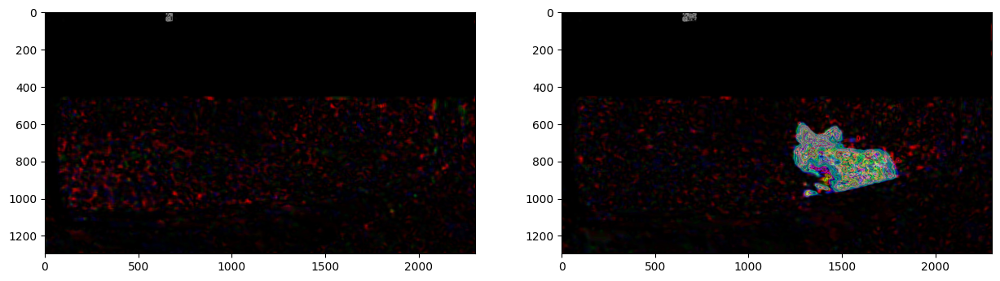

In [312]:
test_denoising(cv.blur, (20, 20))

MSE between empty images: 4.18 
MSE between empty and a cat: 8.03 
difference: 63.06 %


<Figure size 640x480 with 0 Axes>

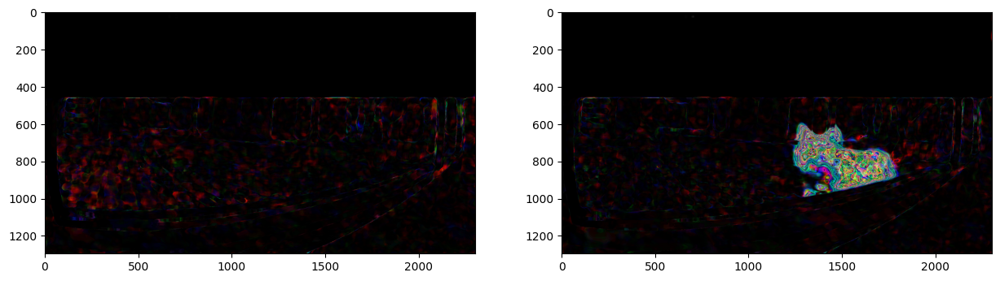

In [339]:
test_denoising(cv.medianBlur, 31)

MSE between empty images: 2.68 
MSE between empty and a cat: 6.86 
difference: 88 %


<Figure size 640x480 with 0 Axes>

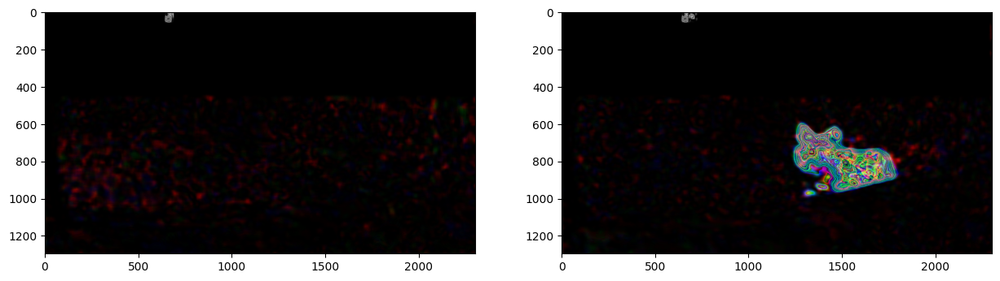

In [373]:
test_denoising(cv.GaussianBlur, ksize=(35, 35), sigmaX=15, sigmaY=15)

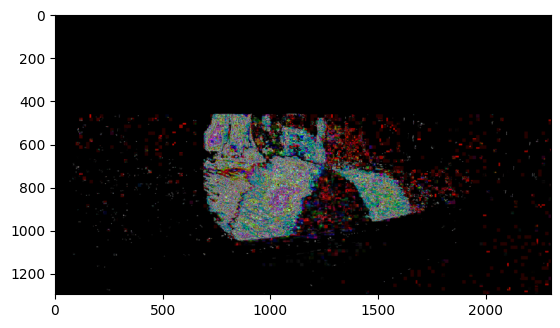

In [403]:
i = 23
diff = np.array(frames[i] - frames[i + 1]) ** 2
plt.imshow(diff)